# Pojeto 1

---

**Alunos**: 

* João Gabriel Sasseron Roberto Amorim (**12542564**)
* Vinicius de Moraes (**13749910**)


**Disciplina**: SCC0252 - Visualização Computacional (2024)

**Docente**: Maria Cristina Ferreira de Oliveira

# Introdução ao dataset cjs

---

O conjunto de dados [cjs](https://openml.org/search?type=data&sort=version&status=any&order=asc&exact_name=cjs&id=473) é originário de um estudo conduzido pelo Dr. Fernando Camacho da Ontario Hydro Technologies, publicado em setembro de 1995 no Canadian Journal of Statistics. O estudo investiga os efeitos dos reguladores de crescimento Paclobutrazol (PP 333) e Flurprimidol (EL-500) sobre o número e o comprimento dos internódios em brotos terminais de árvores de bordo-prateado que foram podadas.

Este estudo tem como objetivo avaliar se os reguladores de crescimento analisados conseguem controlar o crescimento excessivo de árvores, um problema de suma importância para empresas elétricas que precisam podar árvores sob linhas de distribuição. A pesquisa utilizou a técnica de injeção de tronco em árvores de bordo-prateado de 12 anos, com duas dosagens diferentes ($20$ g/L e $4$ g/L). Os resultados foram avaliados 20 meses após a aplicação, abrangendo o comprimento dos brotos terminais, o número de internódios e o comprimento individual de cada internódio.

Colunas e seus significados:

* **N (nominal)**: Index do conjunto de dados. 
* **TREE (categórico)**: Identificador da árvore.
* **BR (nominal)**: Identificador do ramo.
* **TL (numeric)**: Comprimento total do broto (em centímetros). Responsável por medir o comprimento total do broto terminal coletado. Isso indica o crescimento do broto, uma das principais variáveis que o estudo pretende avaliar para verificar o impacto dos reguladores de crescimento.
* **IN (numeric)**: Número de internódios no broto. Ou seja, Representa a quantidade de internódios no broto terminal. O número de internódios reflete o padrão de crescimento, uma vez que um maior número de internódios pode estar relacionado ao maior comprimento do broto.
* **INTERNODE (numeric)**: Comprimento dos internódios no broto.
* **binaryClass (nominal)**: Classificação binária que agrupa as diferentes categorias do tratamento em duas classes: "positiva" ('P') e "negativa" ('N'). 

## Data Profiling

In [40]:
import pandas as pd
import altair as alt
import matplotlib.pyplot as plt
import seaborn as sns
import warnings

warnings.filterwarnings("ignore")

from sklearn.preprocessing import MinMaxScaler
from sklearn.decomposition import PCA
from scipy.io import arff
# from ydata_profiling import ProfileReport


pd.set_option('display.max_columns', 500)

In [41]:
# Leitura do arquivo
arff_file = arff.loadarff('./data/cjs.arff')

df = pd.DataFrame(arff_file[0])

df.head()

,N,TREE,BR,TL,IN,INTERNODE_1,INTERNODE_2,INTERNODE_3,INTERNODE_4,INTERNODE_5,INTERNODE_6,INTERNODE_7,INTERNODE_8,INTERNODE_9,INTERNODE_10,INTERNODE_11,INTERNODE_12,INTERNODE_13,INTERNODE_14,INTERNODE_15,INTERNODE_16,INTERNODE_17,INTERNODE_18,INTERNODE_19,INTERNODE_20,INTERNODE_21,INTERNODE_22,INTERNODE_23,INTERNODE_24,INTERNODE_25,INTERNODE_26,INTERNODE_27,INTERNODE_28,INTERNODE_29,binaryClass
0,1.0,b'G28',b'A',75.0,15.0,1.0,2.3,7.4,8.6,6.7,7.2,6.6,6.2,5.5,5.0,5.4,5.0,4.4,2.6,0.8,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,b'N'
1,2.0,b'G28',b'B',18.0,7.0,0.7,1.3,4.0,5.2,2.8,2.2,1.5,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,b'N'
2,3.0,b'G28',b'C',46.0,11.0,0.5,1.0,4.3,8.8,6.8,7.6,6.2,4.7,3.5,2.2,0.5,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,b'N'
3,4.0,b'G28',b'C',16.0,8.0,0.5,1.2,3.5,4.2,2.2,2.8,1.5,0.1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,b'N'
4,5.0,b'G28',b'D',56.0,16.0,0.5,1.0,3.5,8.2,5.3,6.2,4.8,4.7,3.1,3.8,3.3,4.3,3.5,2.4,1.2,0.3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,b'N'


In [42]:
# ProfileReport(df)

Uma análise superficial do ProfileReport revela um alto número de células faltantes na base de dados, totalizando 68.088 ocorrências, o que representa 69,6% dos valores. A base contém 35 colunas, sendo 27 numéricas, 5 categóricas e 3 não identificadas. Observamos também que, à medida que o número de internodes aumenta, os valores ausentes se tornam significativamente mais frequentes. Além disso, a matriz de correlação indica a presença de semelhanças entre algumas variáveis, que serão explorados futuramente.

## Questões Potenciais

1. Qual é o comprimento médio total dos brotos (TL) e o número de internódios (IN) médios no conjunto de dados para a classe positiva e negativa?
2. Existe uma correlação entre o comprimento total do broto (TL) e o número de internódios (IN) no broto terminal?
3. Para cada número de internódios do broto qual é a média do comprimento total?
4. Qual é a variação no comprimento dos internódios (INTERNODE) entre as classificações binárias "positiva" (P) e "negativa" (N)
5. Qual é a média de comprimento de cada internódio?
6. O tamanho total dos brotos (TL) ifluencia a distribuição do comprimento de cada internódio (INTERNODE)?   

# Pré-processamento

---

## Renomeação e ajuste das colunas

A primeira etapa do pré-processamento envolve o ajuste das colunas. O objetivo desta fase é tornar os nomes das colunas mais fáceis de manipular, além de atribuir-lhes valores mais semânticos, alinhados ao problema que será tratado. Esse processo é essencial para garantir que as informações sejam interpretadas de forma mais clara e coerente durante as próximas fases da análise.

In [43]:
# Ajustando as colunas para minúsculo
df.columns = [column.lower() for column in df.columns]

# Renomeando as colunas
renames = {
    'tree': 'tree_code',        # id da árvore 
    'br': 'branch_code',        # id do ramo
    'tl': 'branch_total_size',  # tamanho total do ramo
    'in': 'internode_count'     # número de ramos
}

df = df.rename(columns=renames)

## Ajuste da codificação e do tipo 

A segunda etapa consiste em ajustar os tipos das variáveis, garantindo que estejam adequados ao formato dos dados. Isso é fundamental para que as visualizações sejam precisas e reflitam corretamente as características e o comportamento das informações analisadas.

In [44]:
# Ajustando nome das colunas que vieram fora da padrão utf-8, 
# por causa do arquivo .arff e transformando coluna de objeto 
# para string.
for column in df.select_dtypes([object]).columns:
    df[column] = df[column].str.decode('utf-8')
    df[column] = df[column].astype('string')
    
# Retirada da coluna usada como index no datafram
df = df.drop(columns=['n'])

## Tratamento de valores nulos

A terceira e última etapa é responsável pelo tratamento dos valores nulos. Nesta fase, optaremos pela alternativa que preserve a maior quantidade possível de registros em nosso conjunto de dados, garantindo que a integridade das informações seja mantida sem comprometer a qualidade da análise.

In [45]:
df.isna().sum()

tree_code               0
branch_code             0
branch_total_size       0
internode_count         0
internode_1             0
internode_2            64
internode_3           637
internode_4          1634
internode_5          1999
internode_6          2172
internode_7          2308
internode_8          2406
internode_9          2489
internode_10         2543
internode_11         2578
internode_12         2608
internode_13         2634
internode_14         2653
internode_15         2660
internode_16         2678
internode_17         2711
internode_18         2725
internode_19         2740
internode_20         2753
internode_21         2770
internode_22         2779
internode_23         2786
internode_24         2789
internode_25         2792
internode_26         2795
internode_27         2795
internode_28         2795
internode_29         2795
binaryclass             0
dtype: int64

Analisando os dados, observamos que os valores ausentes estão concentrados nos internodes. Para tratar esses dados, é importante compreendermos melhor o conceito: internodes são os segmentos do caule de uma planta situados entre dois nós, onde folhas ou ramos se prendem. Portanto, em plantas que não possuem esse "entre nós", consideraremos que a distância entre os nós é zero, ou seja, elas não possuem esse segmento. Por fim, como não há outras colunas com valores vazios, não será necessário aplicar outros tipos de tratamento.

In [46]:
# Preenche os valore vazios com zero
df = df.fillna(0.0)

## Nova feature

Além disso, vale salientar que a maioria das colunas numéricas refere-se aos internodes e possui a mesma unidade de medida, portanto, não será necessário normalizá-las. Embora a coluna internodes_count tenha uma grandeza distinta, por se tratar de uma contagem, decidimos não aplicar nenhum tratamento adicional a essa variável, uma vez que ela reflete uma característica diferente e não interfere nas análises previstas.

In [47]:
# Para respondermos esta pergunta, iremos considerar que existe 5 tamanhos diferentes de brotos.
# Considerandos apenas os valores únicos faremos a distribuição dos tamanhos totais de acordo com os 
# tamanhos de 'Small', 'Medium', e 'Large'.
 
max_branch_total_size = df['branch_total_size'].max()
min_branch_total_size = df['branch_total_size'].min()
diff_branch_total_size = max_branch_total_size - min_branch_total_size

def create_size_label(row):
    if row['branch_total_size']   <= min_branch_total_size + (1 / 3) * diff_branch_total_size:
        return 'Small'
    elif row['branch_total_size'] <= min_branch_total_size + (2 / 3) * diff_branch_total_size:
        return 'Medium'
    else:
        return 'Large'

df['label_size'] = df.apply(lambda row: create_size_label(row), axis=1)

## Normalização

Na terceira etapa, criaremos um DataFrame de dados normalizados, que pode ser útil para análises futurass. Para realizar essa normalização, utilizaremos o MinMax Scaler. Essa abordagem garantirá que as variáveis estejam em uma faixa comum, facilitando a comparação e a interpretação dos resultados.

In [48]:
# Seleciona apenas as colunas que contém o internode
internode_columns = [column for column in df.columns if 'internode' in column]

# Como internode_count já foi analisado separadamente optamos por não mostra-lo
internode_columns.remove('internode_count')

# Para melhor apresentação iremos normalizar os dados
scaler = MinMaxScaler()

df_normalized = df.copy()
df_normalized[internode_columns] = scaler.fit_transform(df[internode_columns])

# Exploração dos dados

---

In [49]:
df.head(10)

,tree_code,branch_code,branch_total_size,internode_count,internode_1,internode_2,internode_3,internode_4,internode_5,internode_6,internode_7,internode_8,internode_9,internode_10,internode_11,internode_12,internode_13,internode_14,internode_15,internode_16,internode_17,internode_18,internode_19,internode_20,internode_21,internode_22,internode_23,internode_24,internode_25,internode_26,internode_27,internode_28,internode_29,binaryclass,label_size
0,G28,A,75.0,15.0,1.0,2.3,7.4,8.6,6.7,7.2,6.6,6.2,5.5,5.0,5.4,5.0,4.4,2.6,0.8,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,N,Medium
1,G28,B,18.0,7.0,0.7,1.3,4.0,5.2,2.8,2.2,1.5,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,N,Small
2,G28,C,46.0,11.0,0.5,1.0,4.3,8.8,6.8,7.6,6.2,4.7,3.5,2.2,0.5,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,N,Small
3,G28,C,16.0,8.0,0.5,1.2,3.5,4.2,2.2,2.8,1.5,0.1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,N,Small
4,G28,D,56.0,16.0,0.5,1.0,3.5,8.2,5.3,6.2,4.8,4.7,3.1,3.8,3.3,4.3,3.5,2.4,1.2,0.3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,N,Small
5,G28,E,77.0,18.0,0.5,0.7,3.0,8.7,7.5,8.0,6.7,6.3,5.4,5.2,6.1,6.2,5.0,2.4,1.1,2.3,1.5,0.6,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,N,Medium
6,G28,F,6.5,5.0,0.5,0.9,2.2,2.5,0.4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,N,Small
7,G28,F,84.5,17.0,1.2,2.8,8.8,9.5,7.2,7.7,6.4,6.8,5.7,5.0,5.4,5.8,3.7,3.7,2.6,1.6,0.6,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,N,Medium
8,G28,F,41.0,11.0,0.7,1.3,5.4,8.0,5.5,6.2,4.2,3.7,3.1,1.9,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,N,Small
9,G28,G,1.0,3.0,0.3,0.5,0.3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,N,Small


## `tree_code` e `branch_code`

In [50]:
print(f'Número de valores únicos para tree: {df["tree_code"].nunique()}')
print(df["tree_code"].unique())

Número de valores únicos para tree: 57
<StringArray>
['G28', 'M33', 'O20', 'G29', 'D21',  'Q5', 'J29', 'Q23', 'J13', 'J25', 'O27',
 'D20', 'J19', 'O33', 'D19',  'J8', 'J10', 'M20', 'J17', 'D10', 'J15', 'M25',
 'Q17', 'M10', 'Q25', 'D14', 'M17',  'J1', 'D18', 'G21', 'J27', 'O28',  'G5',
  'G4', 'D16',  'Q3', 'D13', 'Q12',  'M6', 'D22',  'Q4',  'G9', 'J31', 'G27',
  'G2',  'G6', 'O3O',  'J6', 'J20', 'Q19', 'Q34',  'G7',  'G8', 'J12', 'G20',
 'G10', 'G24']
Length: 57, dtype: string


In [51]:
print(f'Número de valores únicos para br: {df["branch_code"].nunique()}')
print(df["branch_code"].unique())

Número de valores únicos para br: 11
<StringArray>
['A', 'B', 'C', 'D', 'E', 'F', 'G', 'H', '?', 'I', 'J']
Length: 11, dtype: string


Assim, podemos perceber que o estudo foi aplicado em 57 árvores distintas, as quais podem possuir um total de até 11 ramos. Além disso, encontramos 12 instâncias de códigos de ramos mapeados como ‘?’ que serão removidos do conjunto de dados com o intuito de manter a consistência dos dados.


In [52]:
# Remoção dos casos problemáticos
df = df.query('branch_code != "?"')
df_normalized = df_normalized.query('branch_code != "?"')

## `branch_total_size` 

In [53]:
def create_count_bar_plot(df, column_name, maxbins=10, shape=(600, 400)):
    '''
    Cria um gráfico de barras da contagem de valores de uma coluna do DataFrame
    
    Args:
        df (DataFrame): DataFrame contendo os dados
        column_name (string): Coluna alvo
        maxbins (int): Número de divisões
    
    Return:
        bar_plot (altair.vegalite.v5.api.Chart): Gráfico de barras
         
    
    '''
    bar_plot = alt.Chart(df).mark_bar().encode(
                    alt.X(column_name).bin(maxbins=maxbins),
                    y='count()'
                ).properties(
                    width=shape[0],
                    height=shape[1]
                )
        
    return bar_plot

In [54]:
def create_box_plot(df, column_name, shape=(600, 400)):
    '''
    Cria um box plot  de uma coluna do DataFrame
    
    Args:
        df (DataFrame): DataFrame contendo os dados
        column_name (string): Coluna alvo
    
    Return:
        bar_plot (altair.vegalite.v5.api.Chart): Box plot
         
    
    '''
    box_plot = alt.Chart(df).mark_boxplot().encode(
                    alt.X(column_name).scale(zero=False)
                ).properties(
                    width=shape[0],
                    height=shape[1]
                )
        
    return box_plot

In [55]:
hpbts = create_count_bar_plot(df, 'branch_total_size')

bpbts = create_box_plot(df, 'branch_total_size')
        
hpbts | bpbts

alt.HConcatChart(...)

Por meio dos gráficos, fica visível a maior concentração de ramos com o tamanho entre $0$ e $10$. Além da presença de um número significativo de outliers.

## `internode_count` 

In [56]:
hpbc = create_count_bar_plot(df, 'internode_count')

bpbc = create_box_plot(df, 'internode_count')
        
hpbc | bpbc

alt.HConcatChart(...)

Através dos gráficos acima, podemos perceber que a maioria das árvores possuem um número médio de "entre nós" por voltade de $4$. Porém, há árvores que apresentam um número maior de *internodes*, como podemos visualizar o *outlier* mais a direita que possue um total de aproximadamente $30$ internodes.  

## `internode`

In [57]:
# Cria os gráficos de barra
bar_plots = [create_count_bar_plot(df.query(f'{column} > 0'), column, shape=(200, 200)) for column in internode_columns]

# Distribuimos os gráficos para cada linha mostrar um
rows = [alt.hconcat(*bar_plots[i:i+4]) for i in range(0, len(bar_plots), 4)]

# Concatenar todas as filas verticalmente
result = alt.vconcat(*rows)

# Mostrar a matriz
result

alt.VConcatChart(...)

Os gráficos acima mostram que os primeiros internodes estão concentrados em torno da origem e apresentam uma distribuição limitada, com comprimentos menores. À medida que o número de internodes aumenta, embora o comprimento continue reduzido, sua distribuição se torna mais dispersa.

## `binaryclass`

In [58]:
df_pie = df.groupby('binaryclass').size().reset_index(name='count')

pie_chart = alt.Chart(df_pie).mark_arc().encode(
    theta=alt.Theta(field='count', type='quantitative'),  
    color=alt.Color(field='binaryclass', type='nominal'),  
    tooltip=['binaryclass', 'count']  
).properties(
    width=400,
    height=400
)

print(df['binaryclass'].value_counts())

pie_chart 

binaryclass
N    2104
P     680
Name: count, dtype: Int64


alt.Chart(...)

O gráfico de pizza evidencia a má distribuição entre as classes do dataset, ilustrando o desbalanceamento dos dados.


## Correlações

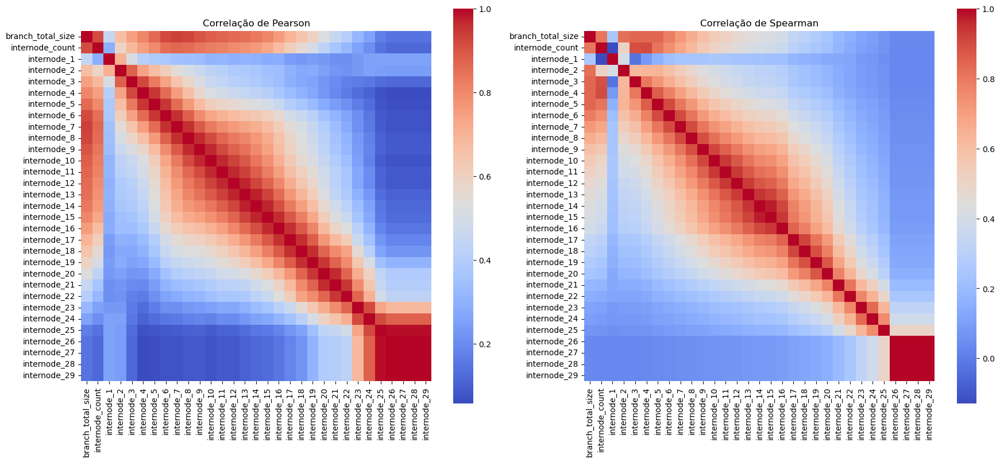

In [59]:
# Seleciona apenas as colunas numéricas
df_numeric = df[df.select_dtypes([float]).columns].copy()

# Cria as matrizes de correlações
pearson_corr  = df_numeric.corr(method='pearson')
spearman_corr = df_numeric.corr(method='spearman')

# Cria a plotagem dos resultados de Pearson
plt.figure(figsize=(18, 8))

plt.subplot(1, 2, 1)
sns.heatmap(pearson_corr, 
            cmap='coolwarm', 
            square=True, 
            cbar=True,
            xticklabels=pearson_corr.columns, 
            yticklabels=pearson_corr.columns)
plt.title('Correlação de Pearson')

# Cria a plotagem dos resultados de Spearman
plt.subplot(1, 2, 2)
sns.heatmap(spearman_corr, 
            cmap='coolwarm', 
            square=True, 
            cbar=True,
            xticklabels=spearman_corr.columns, 
            yticklabels=spearman_corr.columns)
plt.title('Correlação de Spearman')

plt.tight_layout()
plt.show()

A partir dos heatmaps das matrizes de correlação, podemos extrair insights valiosos:
* O tamanho de um internode influencia diretamente o tamanho do internode adjacente, o que é observado em todos os casos. Os maiores graus de correlação ocorrem entre os nós 25 e 29, tanto na correlação de Pearson quanto na de Spearman.
* O comprimento total do ramo impacta diretamente o tamanho dos internodes, especialmente entre os internodes 5 e 15.
* Quanto maior a distância entre os internodes, menor é a correlação entre eles.

## Aplicação do PCA para visualização das classes

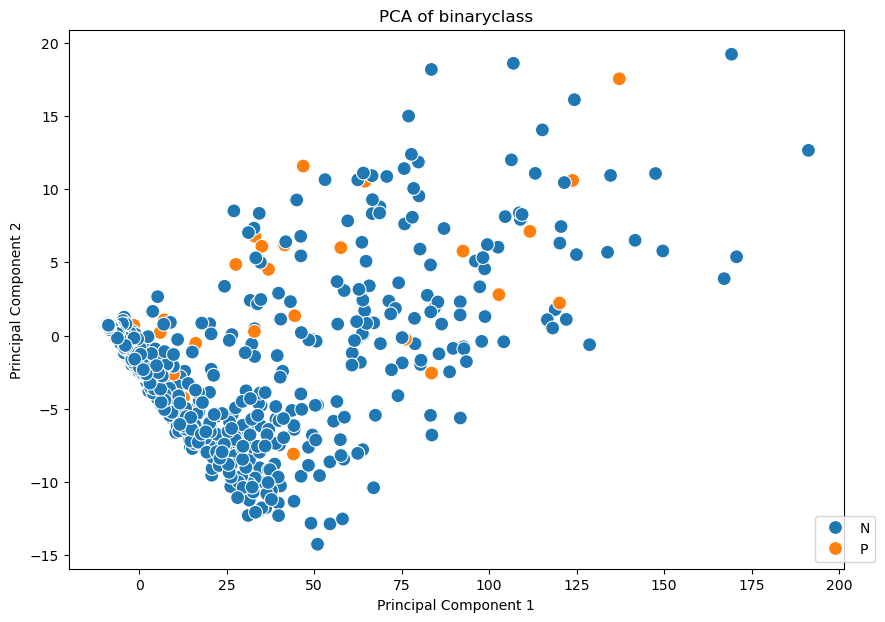

In [60]:
# Realizar PCA com 2 componentes
pca = PCA(n_components=2)
pca_result = pca.fit_transform(df_numeric)

df['PCA1'] = pca_result[:, 0]
df['PCA2'] = pca_result[:, 1]

plt.figure(figsize=(10, 7))
sns.scatterplot(x='PCA1', y='PCA2', data=df, hue='binaryclass', s=100)
plt.title('PCA of binaryclass')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')

plt.legend(loc='lower right', bbox_to_anchor=(1.05, 0))

plt.show()

Analisando o resultado do método PCA, podemos perceber que não house uma distribuição significativa entre os dados, ou seja, tarefas como prediçaão não apresentariam valores significativos de acurácia. Além disso, vale enfatizar que isso também pode acontecer em virtude do desbalanceamentos dos dados do nosso conjunto.

# Discussões

---

1. Qual é o comprimento médio total dos brotos (TL) e o número de internódios (IN) médios no conjunto de dados para a classe positiva e negativa?



             branch_total_size  internode_count
binaryclass                                    
N                    11.167538         4.954848
P                     3.672059         3.685294


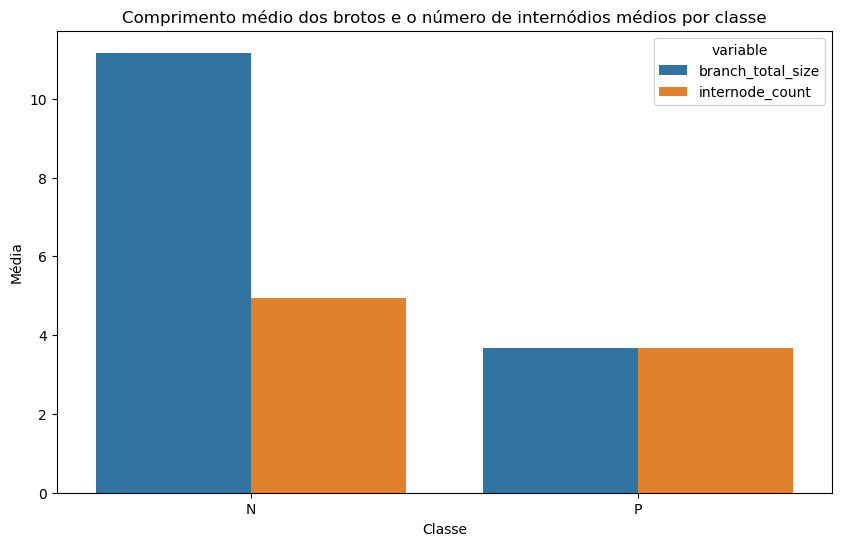

In [61]:
mean_tl_in_by_class = df.groupby('binaryclass')[['branch_total_size', 'internode_count']].mean()

print(mean_tl_in_by_class)

plt.figure(figsize=(10, 6))
sns.barplot(x='binaryclass', y='value', hue='variable', data=pd.melt(df, id_vars=['binaryclass'], value_vars=['branch_total_size', 'internode_count']), ci=None)
plt.title('Comprimento médio dos brotos e o número de internódios médios por classe')
plt.xlabel('Classe')
plt.ylabel('Média')
plt.show()


2. Existe uma correlação entre o comprimento total do broto (TL) e o número de internódios (IN) no broto terminal?


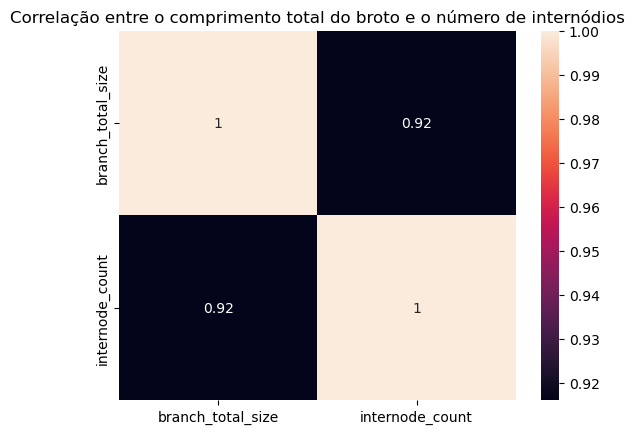

In [62]:
sns.heatmap(df[['branch_total_size', 'internode_count']].corr(),annot=True)
plt.title("Correlação entre o comprimento total do broto e o número de internódios")
plt.show()

3. Para cada número de internódios do broto qual é a média do comprimento total?
   


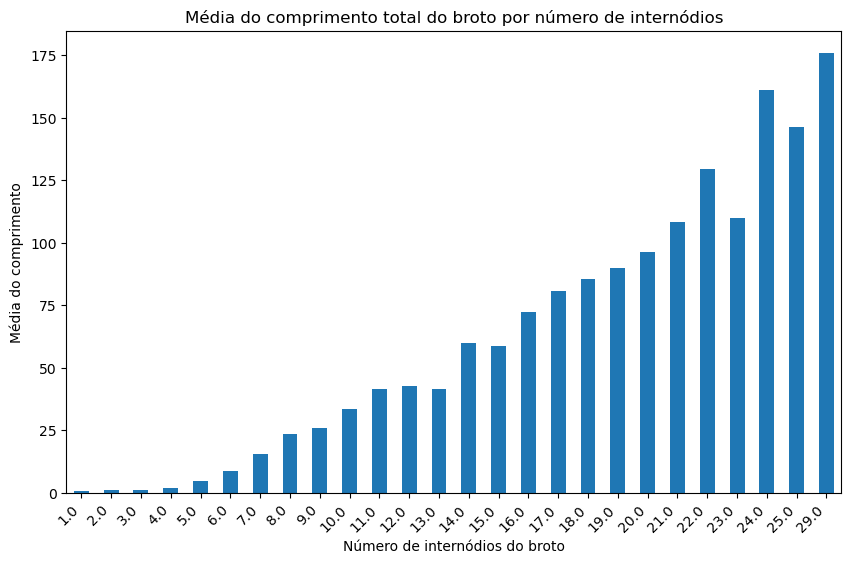

In [63]:
comprimento_media = df.groupby('internode_count')['branch_total_size'].mean()
plt.figure(figsize=(10, 6))
comprimento_media.plot(kind='bar')
plt.xlabel('Número de internódios do broto')
plt.ylabel('Média do comprimento')
plt.title('Média do comprimento total do broto por número de internódios')
plt.xticks(rotation=45, ha='right')
plt.show()

4. Qual é a variação no comprimento dos internódios (INTERNODE) entre as classificações binárias "positiva" (P) e "negativa" (N)


In [64]:
renames = {
    'tree': 'tree_code',        # id da árvore 
    'br': 'branch_code',        # id do ramo
    'tl': 'branch_total_size',  # tamanho total do ramo
    'in': 'internode_count'     # número de ramos
}

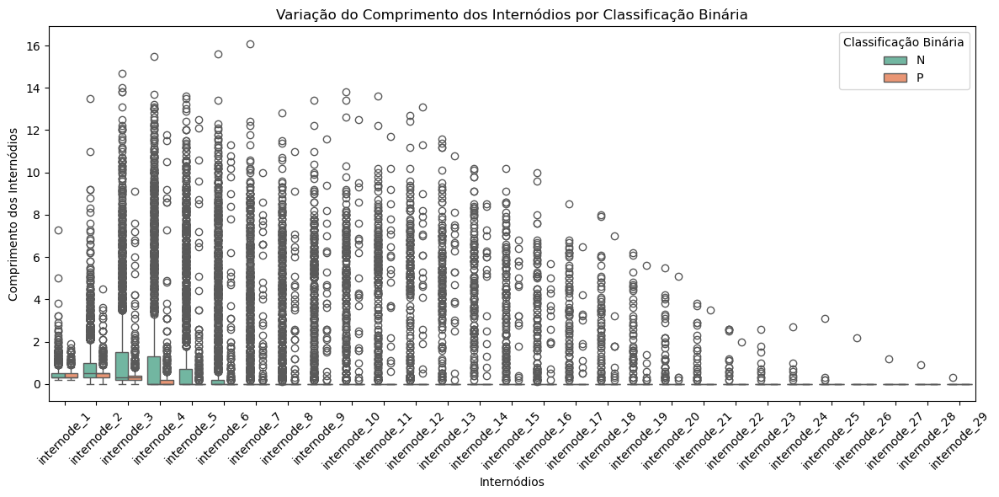

In [65]:
# Criar um boxplot para o comprimento dos internódios ("INTERNODE") entre as classes binárias
df_long = df.melt(id_vars='binaryclass', value_vars=internode_columns,
                  var_name='Internode', value_name='Comprimento')

# Cria um boxplot para cada coluna de internódio por classificação binária
plt.figure(figsize=(12, 6))
sns.boxplot(data=df_long, x='Internode', y='Comprimento', hue='binaryclass', palette='Set2')

# Adiciona título e rótulos aos eixos
plt.title('Variação do Comprimento dos Internódios por Classificação Binária')
plt.xlabel('Internódios')
plt.ylabel('Comprimento dos Internódios')
plt.xticks(rotation=45)
plt.legend(title='Classificação Binária')
plt.tight_layout()
plt.show()


5. Qual é a média de comprimento de cada internódio?

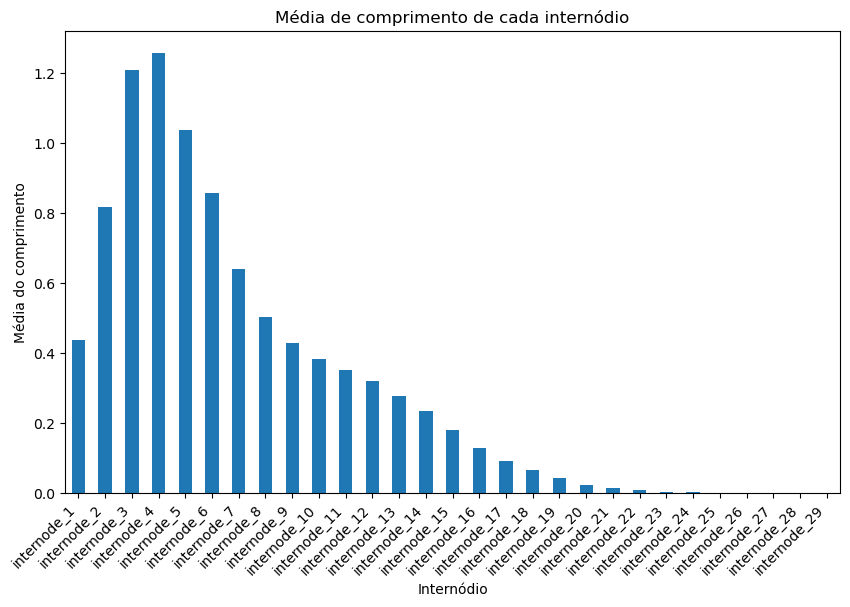

In [66]:
comprimento_media = df[internode_columns].mean()
plt.figure(figsize=(10, 6))
comprimento_media.plot(kind='bar')
plt.xlabel('Internódio')
plt.ylabel('Média do comprimento')
plt.title('Média de comprimento de cada internódio')
plt.xticks(rotation=45, ha='right')
plt.show()

6. O tamanho total dos brotos (TL) influência a distribuição do comprimento de cada internódio (INTERNODE)? Avalie para cada label_size e comente os resultados.


In [67]:
# Cria o seletor para o gráfico de label_size
label_size_selection = alt.selection_point(fields=['label_size'])

# Cria o seletor para o gráfico de label_size
label_size_selection = alt.selection_point(fields=['label_size'])

# Gráfico de seleção por label_size
label_size_chart = alt.Chart(df_normalized).mark_bar().encode(
    x=alt.X('label_size:N', title='label_size', sort='ascending'),
    y=alt.Y('count():Q', title='Count'),
    color=alt.condition(label_size_selection, 'label_size:N', alt.value('lightgray'))
).add_params(
    label_size_selection
).properties(
    width=200,
    height=400
)

# Gráfico principal com filtro por label_size e ordenação por 'internode_columns'
main_chart = alt.Chart(df_normalized).transform_filter(
    label_size_selection
).transform_window(
    index='count()'
).transform_fold(
    internode_columns
).transform_calculate(
    minmax_value=(alt.datum.value)
).mark_line().encode(
    x=alt.X('key:N', title='Internode Columns', sort=internode_columns),
    y=alt.Y('minmax_value:Q', title='Branch Total Size Normalized').scale(domain=[0, 1]),
    color='label_size:N',
    detail='index:N',
).properties(
    width=1000,
    height=400
)

# Combina os gráficos em uma visualização lado a lado com filtro
chart = alt.hconcat(label_size_chart, main_chart)
chart


alt.HConcatChart(...)

Pela distribuição dos dados, podemos perceber que o primerio entre nó possui um tamanho similar para todos os tamanhos de ramos. Porém, a medida que o tamanho do broto aumenta, o tamanho dos *internodes* também possuem um crescimento.

# Visualizações Iterativas

Além da visualização iterativa empregada acima para resolver a questão seis. Também, foi criadas outras visualizações para a exploração dos dados.

In [68]:
brush = alt.selection_interval(encodings=['x'])

# Gráfico de barras
bars = alt.Chart(df).mark_bar().encode(
    x=alt.X('branch_code:N', title='Branch Code'),
    y=alt.Y('mean(branch_total_size):Q', title='Branch Total Size'),
).add_params(
    brush
)

# Regra para média
line = alt.Chart(df).mark_rule(color='firebrick').encode(
    y=alt.Y('mean(branch_total_size):Q', title='Mean Size'),
    size=alt.SizeValue(3)
).transform_filter(
    brush
)

# Combinação dos gráficos
chart = alt.layer(bars, line).properties(
    width=800,
    height=400
)

chart

alt.LayerChart(...)

Esta visualização interativa permite acompanhar a média total de cada ramo com base em seu código. Além disso, por ser interativa, é possível selecionar os códigos desejados para calcular a média total, representada pela linha vermelha. Essa funcionalidade é especialmente útil para extrairmos insights focadas em subconjuntos específicos dentro do gráfico.